# show reconstruct image

In [1]:
import pickle
import yaml
import os
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import torch.nn.functional as F

In [2]:
########################################################################
# load config
########################################################################
with open("./config.yaml", 'rb') as f:
    config = yaml.load(f)

/home/hiroki/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  """


In [3]:
########################################################################
# Setting I/O path
########################################################################
# input dirs
INPUT_ROOT = config['IO_OPTION']['INPUT_ROOT']
dev_path = INPUT_ROOT + "/dev_data"
add_dev_path = INPUT_ROOT + "/add_dev_data"
eval_path = INPUT_ROOT + "/eval_test"
MODEL_DIR = config['IO_OPTION']['OUTPUT_ROOT'] + '/models'
# machine type
MACHINE_TYPE = config['IO_OPTION']['MACHINE_TYPE']
machine_types = os.listdir(dev_path)
# output dirs
OUTPUT_ROOT = config['IO_OPTION']['OUTPUT_ROOT']
RESULT_DIR = config['IO_OPTION']['OUTPUT_ROOT'] + '/result'
RECONS_OUTDIR = OUTPUT_ROOT +'/eval_reconstruct_img'
PKL_DIR = OUTPUT_ROOT +'/pkl'
os.makedirs(MODEL_DIR, exist_ok=True)

In [4]:
with open('{}/{}_history.pkl'.format(PKL_DIR, 'valve'), 'rb') as file:
    history = pickle.load(file)

In [5]:
history['reconstruct_img']['input'][0].shape

torch.Size([1, 128, 128])

In [6]:
epoch_num = 6 # * 10

In [7]:
input_img = history['reconstruct_img']['input'][epoch_num][0,:,:].to('cpu')
output_img = history['reconstruct_img']['output'][epoch_num][0,:,:].to('cpu')

In [8]:
input_img.shape

torch.Size([128, 128])

In [9]:
np.array(F.mse_loss(output_img, input_img))

array(8.524275, dtype=float32)

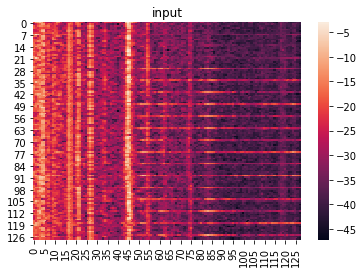

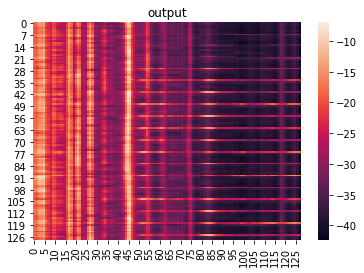

In [10]:
sns.heatmap(input_img)
plt.title('input')
plt.show()
sns.heatmap(output_img)
plt.title('output')
plt.show()

# eval

## import library

In [11]:
########################################################################
# import default python-library
########################################################################
import os
import glob
import csv
import re
import itertools
import sys
from collections import defaultdict
########################################################################


########################################################################
# import additional python-library
########################################################################
import numpy
from sklearn import metrics
import common as com
import pytorch_modeler as modeler
from pytorch_model import LSTM_AutoEncoder as Model
import torch.utils.data
import yaml
yaml.warnings({'YAMLLoadWarning': False})
import matplotlib.pyplot as plt
import seaborn as sns
########################################################################
import eval_functions as eval_func

## Setting

In [12]:
########################################################################
# load config
########################################################################
with open("./config.yaml", 'rb') as f:
    config = yaml.load(f)

/home/hiroki/anaconda3/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [13]:
########################################################################
# Setting seed
########################################################################
modeler.set_seed(42)

In [14]:
########################################################################
# Setting I/O path
########################################################################
# input dirs
INPUT_ROOT = config['IO_OPTION']['INPUT_ROOT']
dev_path = INPUT_ROOT + "/dev_data"
add_dev_path = INPUT_ROOT + "/add_dev_data"
eval_path = INPUT_ROOT + "/eval_test"
MODEL_DIR = config['IO_OPTION']['OUTPUT_ROOT'] + '/models'
# machine type
MACHINE_TYPE = config['IO_OPTION']['MACHINE_TYPE']
machine_types = os.listdir(dev_path)
# output dirs
OUTPUT_ROOT = config['IO_OPTION']['OUTPUT_ROOT']
RESULT_DIR = config['IO_OPTION']['OUTPUT_ROOT'] + '/result'
RECONS_OUTDIR = OUTPUT_ROOT +'/eval_reconstruct_img'
os.makedirs(MODEL_DIR, exist_ok=True)

In [15]:
########################################################################
# for original function
########################################################################
param = {}
param["dev_directory"] = dev_path
param["eval_directory"] = eval_path
param["model_directory"] = MODEL_DIR
param["result_directory"] = RESULT_DIR
param["result_file"] = 'result.csv'

In [27]:
from sklearn.metrics import mean_squared_error as mse

def calc_time_anomaly(x, y, label, file_name):
    fig = plt.figure(figsize=(10,5)) # width, height
    fig.suptitle('label={}'.format(int(label)))
    time_anomaly = np.zeros((x.shape[0]))
    for frame in range(x.shape[0]):
        time_anomaly[frame] = mse(y[frame,:],x[frame,:])
    plt.plot(time_anomaly)
    plt.title(f'label:{label}')

/home/hiroki/anaconda3/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


SyntaxError: invalid syntax (<ipython-input-27-bcd70838dd94>, line 3)

In [26]:
time_anomaly.mean()

/home/hiroki/anaconda3/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


6.790814679116011

/home/hiroki/anaconda3/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


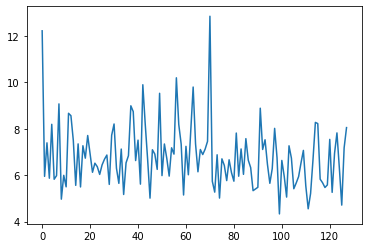

In [25]:
plt.plot(time_anomaly)

/home/hiroki/anaconda3/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


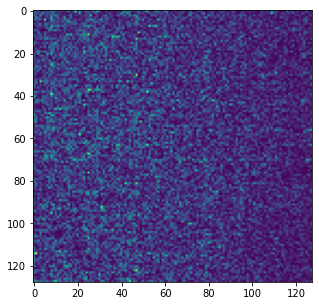

In [33]:
plt.figure(figsize=(5,5))
plt.imshow(np.abs(x-y), aspect='auto')

## run eval

In [16]:
def make_reconstruct_img(x, y, label, file_name):
    fig = plt.figure(figsize=(10,5)) # width, height
    fig.suptitle('label={}'.format(int(label)))
    ax1 = fig.add_subplot(121, title='x') # 明示的にAxesを作成する
    sns.heatmap(x.T, ax=ax1) # ax1を参照するようにする
    ax2 = fig.add_subplot(122, title='y')
    sns.heatmap(y.T, ax=ax2)
    fig.savefig('{}.png'.format(file_name))

In [17]:
mode = 'dev'

2020-11-07 15:39:35,930 - INFO - load_directory <- development
2020-11-07 15:39:35,932 - INFO - ===========================
2020-11-07 15:39:35,933 - INFO - [1/6] /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/ToyCar
2020-11-07 15:39:35,933 - INFO - ============== MODEL LOAD ==============
2020-11-07 15:39:36,808 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/ToyCar_id_01
2020-11-07 15:39:36,816 - INFO - test_file  num : 601
2020-11-07 15:39:36,817 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-07 15:39:44,975 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM3CNN_AE/result/anomaly_score_ToyCar_id_01.csv
2020-11-07 15:39:44,978 - INFO - AUC : 0.6728286852589641
2020-11-07 15:39:44,979 - INFO - pAUC : 0.5370697660485876
2020-11-07 15:39:44,980 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-07 15:39:44,980 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/ToyCar_id_02
2020-11-07 15:39:44,989 - INFO - test_file  num : 602
2020-11-07 15:39:44,990 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-07 15:39:53,077 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM3CNN_AE/result/anomaly_score_ToyCar_id_02.csv
2020-11-07 15:39:53,080 - INFO - AUC : 0.7286054421768707
2020-11-07 15:39:53,081 - INFO - pAUC : 0.5659386561642201
2020-11-07 15:39:53,081 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-07 15:39:53,082 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/ToyCar_id_03
2020-11-07 15:39:53,092 - INFO - test_file  num : 602
2020-11-07 15:39:53,093 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-07 15:40:01,635 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM3CNN_AE/result/anomaly_score_ToyCar_id_03.csv
2020-11-07 15:40:01,638 - INFO - AUC : 0.618968253968254
2020-11-07 15:40:01,638 - INFO - pAUC : 0.5238691968015277
2020-11-07 15:40:01,639 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-07 15:40:01,640 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/ToyCar_id_04
2020-11-07 15:40:01,648 - INFO - test_file  num : 602
2020-11-07 15:40:01,649 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-07 15:40:09,940 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM3CNN_AE/result/anomaly_score_ToyCar_id_04.csv
2020-11-07 15:40:09,944 - INFO - AUC : 0.7720975056689342
2020-11-07 15:40:09,945 - INFO - pAUC : 0.6023391812865497
2020-11-07 15:40:09,945 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-07 15:40:09,946 - INFO - ===========================
2020-11-07 15:40:09,947 - INFO - [2/6] /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/ToyConveyor
2020-11-07 15:40:09,947 - INFO - ============== MODEL LOAD ==============
2020-11-07 15:40:10,337 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/ToyConveyor_id_01
2020-11-07 15:40:10,349 - INFO - test_file  num : 1181
2020-11-07 15:40:10,349 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-07 15:40:24,003 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM3CNN_AE/result/anomaly_score_ToyConveyor_id_01.csv
2020-11-07 15:40:24,007 - INFO - AUC : 0.7234317585301837
2020-11-07 15:40:24,007 - INFO - pAUC : 0.6003418980522172
2020-11-07 15:40:24,008 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-07 15:40:24,009 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/ToyConveyor_id_02
2020-11-07 15:40:24,019 - INFO - test_file  num : 1136
2020-11-07 15:40:24,020 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============
/home/hiroki/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


2020-11-07 15:40:37,236 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM3CNN_AE/result/anomaly_score_ToyConveyor_id_02.csv
2020-11-07 15:40:37,240 - INFO - AUC : 0.6323251488095238
2020-11-07 15:40:37,240 - INFO - pAUC : 0.5581140350877193
2020-11-07 15:40:37,241 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-07 15:40:37,242 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/ToyConveyor_id_03
2020-11-07 15:40:37,253 - INFO - test_file  num : 1135
2020-11-07 15:40:37,253 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-07 15:40:50,268 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM3CNN_AE/result/anomaly_score_ToyConveyor_id_03.csv
2020-11-07 15:40:50,272 - INFO - AUC : 0.7724350378449252
2020-11-07 15:40:50,273 - INFO - pAUC : 0.6239974153155103
2020-11-07 15:40:50,273 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-07 15:40:50,274 - INFO - ===========================
2020-11-07 15:40:50,275 - INFO - [3/6] /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/fan
2020-11-07 15:40:50,275 - INFO - ============== MODEL LOAD ==============
2020-11-07 15:40:50,913 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/fan_id_00
2020-11-07 15:40:50,922 - INFO - test_file  num : 489
2020-11-07 15:40:50,929 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-07 15:41:00,418 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM3CNN_AE/result/anomaly_score_fan_id_00.csv
2020-11-07 15:41:00,421 - INFO - AUC : 0.5465552699228793
2020-11-07 15:41:00,422 - INFO - pAUC : 0.4947909619807874
2020-11-07 15:41:00,422 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-07 15:41:00,423 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/fan_id_02
2020-11-07 15:41:00,430 - INFO - test_file  num : 441
2020-11-07 15:41:00,431 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-07 15:41:09,338 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM3CNN_AE/result/anomaly_score_fan_id_02.csv
2020-11-07 15:41:09,341 - INFO - AUC : 0.6861583577712611
2020-11-07 15:41:09,342 - INFO - pAUC : 0.5419046149097083
2020-11-07 15:41:09,342 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-07 15:41:09,343 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/fan_id_04
2020-11-07 15:41:09,348 - INFO - test_file  num : 430
2020-11-07 15:41:09,349 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-07 15:41:17,897 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM3CNN_AE/result/anomaly_score_fan_id_04.csv
2020-11-07 15:41:17,900 - INFO - AUC : 0.5888484848484848
2020-11-07 15:41:17,900 - INFO - pAUC : 0.5488038277511962
2020-11-07 15:41:17,901 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-07 15:41:17,902 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/fan_id_06
2020-11-07 15:41:17,909 - INFO - test_file  num : 443
2020-11-07 15:41:17,910 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-07 15:41:26,889 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM3CNN_AE/result/anomaly_score_fan_id_06.csv
2020-11-07 15:41:26,893 - INFO - AUC : 0.8013411078717201
2020-11-07 15:41:26,893 - INFO - pAUC : 0.5573116464630965
2020-11-07 15:41:26,894 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-07 15:41:26,895 - INFO - ===========================
2020-11-07 15:41:26,895 - INFO - [4/6] /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/pump
2020-11-07 15:41:26,896 - INFO - ============== MODEL LOAD ==============
2020-11-07 15:41:27,503 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/pump_id_00
2020-11-07 15:41:27,507 - INFO - test_file  num : 237
2020-11-07 15:41:27,508 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-07 15:41:32,089 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM3CNN_AE/result/anomaly_score_pump_id_00.csv
2020-11-07 15:41:32,092 - INFO - AUC : 0.6947445255474454
2020-11-07 15:41:32,093 - INFO - pAUC : 0.5728006146753746
2020-11-07 15:41:32,093 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-07 15:41:32,094 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/pump_id_02
2020-11-07 15:41:32,098 - INFO - test_file  num : 205
2020-11-07 15:41:32,099 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-07 15:41:36,189 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM3CNN_AE/result/anomaly_score_pump_id_02.csv
2020-11-07 15:41:36,193 - INFO - AUC : 0.6046666666666667
2020-11-07 15:41:36,193 - INFO - pAUC : 0.5859649122807018
2020-11-07 15:41:36,194 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-07 15:41:36,194 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/pump_id_04
2020-11-07 15:41:36,198 - INFO - test_file  num : 194
2020-11-07 15:41:36,199 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-07 15:41:40,049 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM3CNN_AE/result/anomaly_score_pump_id_04.csv
2020-11-07 15:41:40,051 - INFO - AUC : 0.899468085106383
2020-11-07 15:41:40,052 - INFO - pAUC : 0.681410974244121
2020-11-07 15:41:40,052 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-07 15:41:40,053 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/pump_id_06
2020-11-07 15:41:40,057 - INFO - test_file  num : 196
2020-11-07 15:41:40,058 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-07 15:41:44,053 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM3CNN_AE/result/anomaly_score_pump_id_06.csv
2020-11-07 15:41:44,057 - INFO - AUC : 0.6942708333333333
2020-11-07 15:41:44,057 - INFO - pAUC : 0.5317982456140351
2020-11-07 15:41:44,058 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-07 15:41:44,058 - INFO - ===========================
2020-11-07 15:41:44,059 - INFO - [5/6] /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/slider
2020-11-07 15:41:44,060 - INFO - ============== MODEL LOAD ==============
2020-11-07 15:41:44,678 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/slider_id_00
2020-11-07 15:41:44,682 - INFO - test_file  num : 445
2020-11-07 15:41:44,684 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-07 15:41:51,394 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM3CNN_AE/result/anomaly_score_slider_id_00.csv
2020-11-07 15:41:51,397 - INFO - AUC : 0.9631884057971014
2020-11-07 15:41:51,398 - INFO - pAUC : 0.8578184591914568
2020-11-07 15:41:51,399 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-07 15:41:51,400 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/slider_id_02
2020-11-07 15:41:51,404 - INFO - test_file  num : 356
2020-11-07 15:41:51,405 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-07 15:41:57,028 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM3CNN_AE/result/anomaly_score_slider_id_02.csv
2020-11-07 15:41:57,031 - INFO - AUC : 0.758515625
2020-11-07 15:41:57,031 - INFO - pAUC : 0.5814144736842105
2020-11-07 15:41:57,032 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-07 15:41:57,033 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/slider_id_04
2020-11-07 15:41:57,037 - INFO - test_file  num : 267
2020-11-07 15:41:57,037 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-07 15:42:01,726 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM3CNN_AE/result/anomaly_score_slider_id_04.csv
2020-11-07 15:42:01,730 - INFO - AUC : 0.9558083832335329
2020-11-07 15:42:01,730 - INFO - pAUC : 0.792625275764261
2020-11-07 15:42:01,731 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-07 15:42:01,732 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/slider_id_06
2020-11-07 15:42:01,737 - INFO - test_file  num : 178
2020-11-07 15:42:01,737 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-07 15:42:05,478 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM3CNN_AE/result/anomaly_score_slider_id_06.csv
2020-11-07 15:42:05,481 - INFO - AUC : 0.7526923076923077
2020-11-07 15:42:05,482 - INFO - pAUC : 0.5040485829959515
2020-11-07 15:42:05,483 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-07 15:42:05,483 - INFO - ===========================
2020-11-07 15:42:05,484 - INFO - [6/6] /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/valve
2020-11-07 15:42:05,484 - INFO - ============== MODEL LOAD ==============
2020-11-07 15:42:05,888 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/valve_id_00
2020-11-07 15:42:05,894 - INFO - test_file  num : 213
2020-11-07 15:42:05,895 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-07 15:42:10,529 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM3CNN_AE/result/anomaly_score_valve_id_00.csv
2020-11-07 15:42:10,532 - INFO - AUC : 0.568495575221239
2020-11-07 15:42:10,533 - INFO - pAUC : 0.5062878435025617
2020-11-07 15:42:10,533 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-07 15:42:10,534 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/valve_id_02
2020-11-07 15:42:10,538 - INFO - test_file  num : 214
2020-11-07 15:42:10,539 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-07 15:42:14,705 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM3CNN_AE/result/anomaly_score_valve_id_02.csv
2020-11-07 15:42:14,708 - INFO - AUC : 0.7206140350877193
2020-11-07 15:42:14,709 - INFO - pAUC : 0.5226223453370268
2020-11-07 15:42:14,709 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-07 15:42:14,710 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/valve_id_04
2020-11-07 15:42:14,715 - INFO - test_file  num : 214
2020-11-07 15:42:14,716 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-07 15:42:18,950 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM3CNN_AE/result/anomaly_score_valve_id_04.csv
2020-11-07 15:42:18,953 - INFO - AUC : 0.676140350877193
2020-11-07 15:42:18,954 - INFO - pAUC : 0.5267774699907664
2020-11-07 15:42:18,955 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-07 15:42:18,955 - INFO - target_dir : /media/hiroki/working/research/dcase2020/datasets/DCASE2/dev_data/valve_id_06
2020-11-07 15:42:18,959 - INFO - test_file  num : 214
2020-11-07 15:42:18,960 - INFO - ============== BEGIN TEST FOR A MACHINE ID ==============


2020-11-07 15:42:23,182 - INFO - anomaly score result ->  /media/hiroki/working/research/dcase2020/result/2D/LSTM3CNN_AE/result/anomaly_score_valve_id_06.csv
2020-11-07 15:42:23,185 - INFO - AUC : 0.4996491228070175
2020-11-07 15:42:23,186 - INFO - pAUC : 0.4866112650046168
2020-11-07 15:42:23,186 - INFO - ============ END OF TEST FOR A MACHINE ID ============
2020-11-07 15:42:23,187 - INFO - AUC and pAUC results -> /media/hiroki/working/research/dcase2020/result/2D/LSTM3CNN_AE/result/result.csv


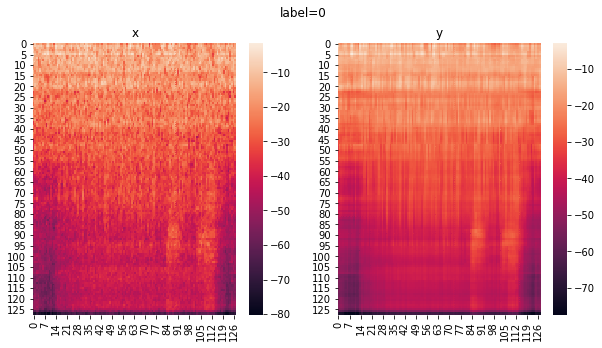

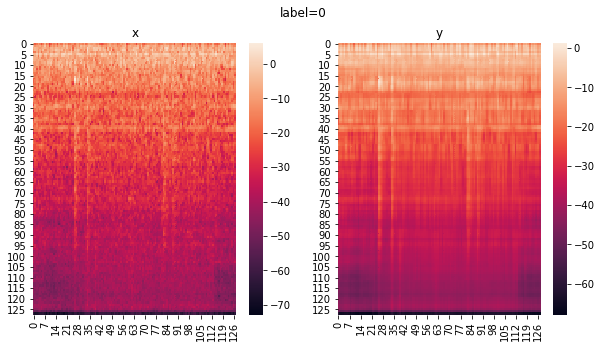

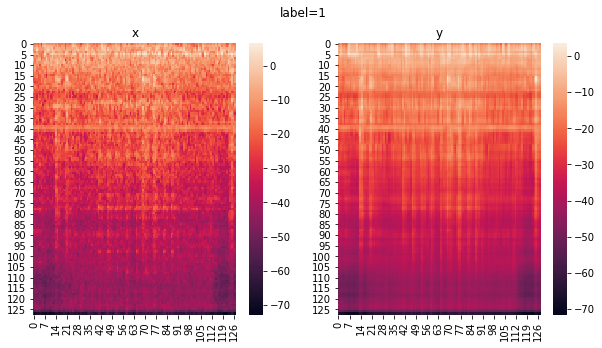

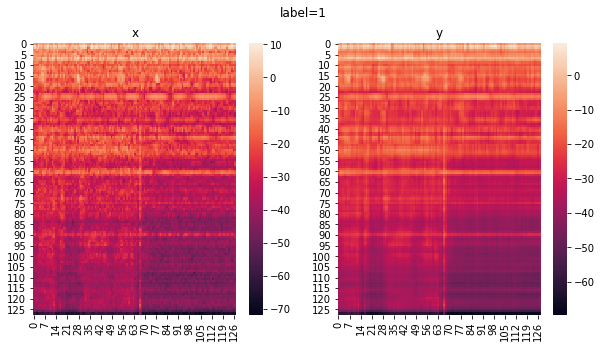

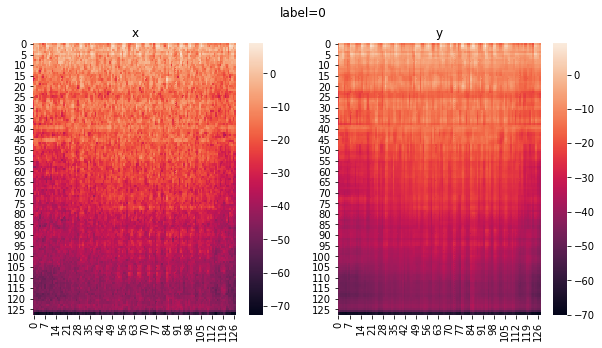

...

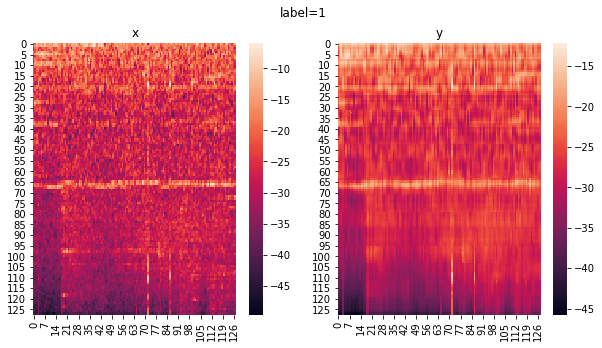

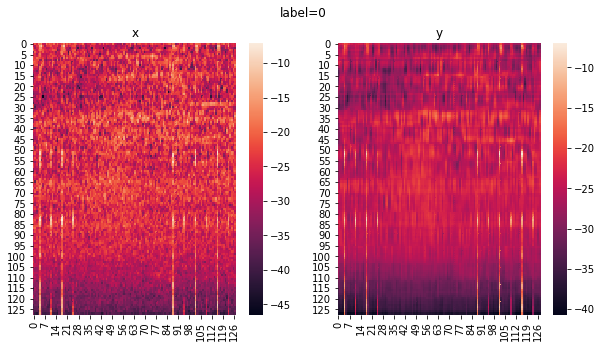

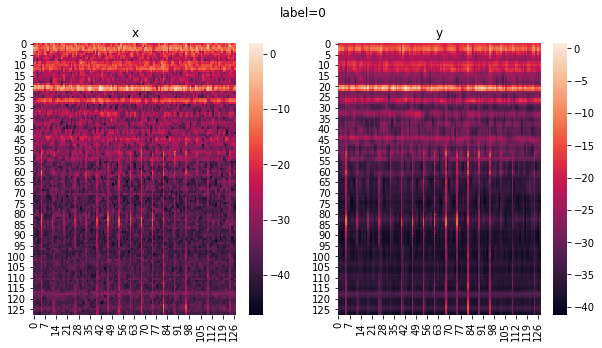

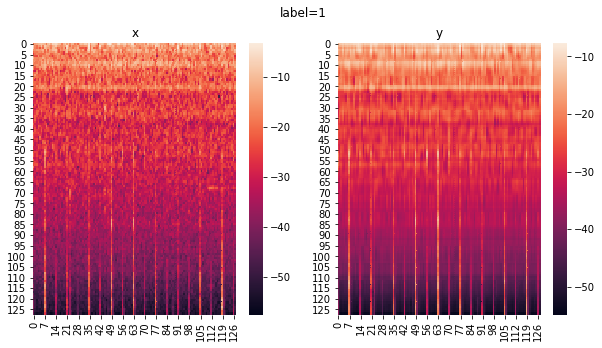

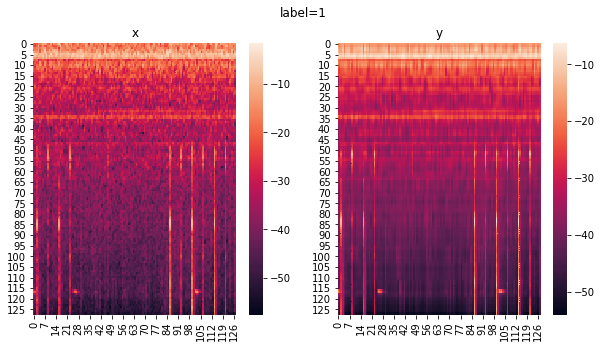

In [18]:
#def run_eval(param, mode):
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# make output result directory
os.makedirs(RESULT_DIR, exist_ok=True)

# load base directory
dirs = com.select_dirs(param=param, mode=mode)

# initialize lines in csv for AUC and pAUC
csv_lines = []


# loop of the base directory
for idx, target_dir in enumerate(dirs):
    com.logger.info("===========================")
    com.logger.info("[{idx}/{total}] {dirname}".format(
        dirname=target_dir, idx=idx+1, total=len(dirs)))

    machine_type = os.path.split(target_dir)[1]

    com.logger.info("============== MODEL LOAD ==============")

    model_file = "{model}/{machine_type}_model.pth".format(
        model=param["model_directory"],
        machine_type=machine_type)

    if not os.path.exists(model_file):
        com.logger.error("{} model not found ".format(machine_type))
        sys.exit(-1)

    # define AE model
    model = Model(sample_rate=config['preprocessing']['sample_rate'],
                  window_size=config['preprocessing']['window_size'],
                  hop_size=config['preprocessing']['hop_size'],
                  mel_bins=config['preprocessing']['mel_bins'],
                  fmin=config['preprocessing']['fmin'],
                  fmax=config['preprocessing']['fmax']).to(device)
    model.eval()
    model.load_state_dict(torch.load(model_file))

    if mode:
        # results by type
        csv_lines.append([machine_type])
        csv_lines.append(["id", "AUC", "pAUC"])
        performance = []

    machine_id_list = eval_func.get_machine_id_list_for_test(target_dir)
    recons_outpath = RECONS_OUTDIR + '/' + machine_type
    os.makedirs(recons_outpath, exist_ok=True)
    for id_str in machine_id_list:

        # load list of test files
        test_files, y_true = eval_func.test_file_list_generator(target_dir, id_str, mode)

        # setup anomaly score file path
        anomaly_score_csv = \
            "{result}/anomaly_score_{machine_type}_{id_str}.csv"\
            .format(result=param["result_directory"],
                    machine_type=machine_type,
                    id_str=id_str)
        anomaly_score_list = []

        com.logger.info(
            "============== BEGIN TEST FOR A MACHINE ID ==============")

        y_pred = [0. for k in test_files]
        anomaly_count = 0
        normal_count = 0
        for file_idx, file_path in enumerate(test_files):
            try:
                data = com.file_load(file_path)
                data = data[0]
                # reconstruction through auto encoder in pytorch
                input_data = torch.from_numpy(data).float().to(device)
                input_data = input_data.unsqueeze(0)
                with torch.no_grad():
                    output_dict = model(input_data)
                    pred = output_dict['loss'].to('cpu').detach().numpy().copy()
                    # make reconstruct_img
                    x = output_dict['x'].to('cpu')[0,:,:]
                    y = output_dict['y'].to('cpu')[0,:,:]
                    label = y_true[file_idx]
                    file_name = os.path.basename(file_path).replace('.wav', '')
                    file_name = recons_outpath + '/' + file_name
                    if int(label) == 1:
                        if anomaly_count == 1 or anomaly_count == 2:
                            make_reconstruct_img(x, y, label, file_name)
                        anomaly_count+=1
                    else:
                        if normal_count == 1 or normal_count == 2:
                            make_reconstruct_img(x, y, label, file_name)
                        normal_count+=1
                    
                y_pred[file_idx] = pred
                anomaly_score_list.append(
                    [os.path.basename(file_path), y_pred[file_idx]])
            except FileNotFoundError:
                com.logger.error("file broken!!: {}".format(file_path))

        # save anomaly score
        eval_func.save_csv(save_file_path=anomaly_score_csv,
                           save_data=anomaly_score_list)
        com.logger.info(
            "anomaly score result ->  {}".format(anomaly_score_csv))

        if mode:
            # append AUC and pAUC to lists
            auc = metrics.roc_auc_score(y_true, y_pred)
            p_auc = metrics.roc_auc_score(
                y_true, y_pred, max_fpr=config["etc"]["max_fpr"])
            csv_lines.append([id_str.split("_", 1)[1], auc, p_auc])
            performance.append([auc, p_auc])
            com.logger.info("AUC : {}".format(auc))
            com.logger.info("pAUC : {}".format(p_auc))

        com.logger.info(
            "============ END OF TEST FOR A MACHINE ID ============")

    if mode:
        # calculate averages for AUCs and pAUCs
        averaged_performance = numpy.mean(
            numpy.array(performance, dtype=float), axis=0)
        csv_lines.append(["Average"] + list(averaged_performance))
        csv_lines.append([])

if mode:
    # output results
    result_path = "{result}/{file_name}".format(
        result=param["result_directory"],
        file_name=param["result_file"])
    com.logger.info("AUC and pAUC results -> {}".format(result_path))
    eval_func.save_csv(save_file_path=result_path, save_data=csv_lines)